# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [2]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        #### END CODE HERE ####
        nn.ReLU(inplace=True)
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [6]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8,im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [7]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [12]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples,z_dim, device = device)
    #### END CODE HERE ####

In [13]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](https://drive.google.com/uc?export=view&id=1ePf0x1EkkK0Ll0V5lxsZQl5aJ1cEOYOr)  |  ![](https://drive.google.com/uc?export=view&id=1Qp0aiob39MKPGVw6OecYXBhhlx-c-MpB)





In [14]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim,output_dim),
        nn.LeakyReLU(0.2)
        #### END CODE HERE ####
    )

In [15]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [16]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim,1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [17]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [18]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [19]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [20]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    noise_vec = torch.randn(num_images,z_dim,device=device)
    gen_img = gen(noise_vec)
    disc_pred = disc(gen_img.detach())
    disc_fake_loss = criterion(disc_pred,torch.zeros_like(disc_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred,torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) /2
    #### END CODE HERE ####
    return disc_loss

In [21]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")


Success!


In [24]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    noise_vec = torch.randn(num_images,z_dim,device=device)
    gen_pred = gen(noise_vec)
    disc_pred = disc(gen_pred)
    gen_loss = criterion(disc_pred,torch.ones_like(disc_pred))
    #### END CODE HERE ####
    return gen_loss

In [25]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](https://drive.google.com/uc?export=view&id=1BlfFNZACaieFrOjMv_o2kGqwAR6eiLmN)

Step 500: Generator loss: 1.4497587249279011, discriminator loss: 0.4167246414422985


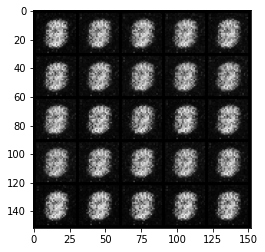

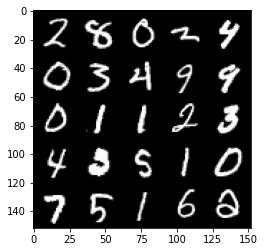

Step 1000: Generator loss: 1.8006668326854707, discriminator loss: 0.27063493901491154


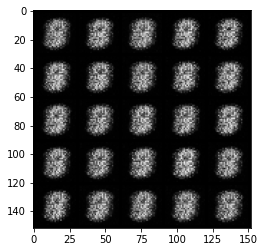

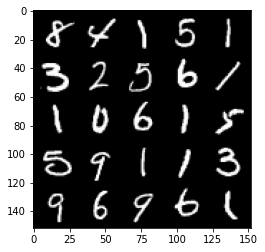

Step 1500: Generator loss: 2.079422308683395, discriminator loss: 0.15609562119841577


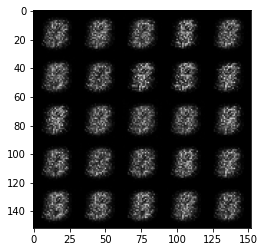

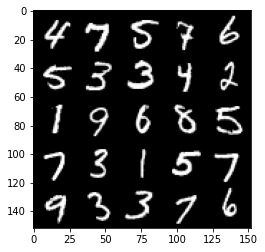

Step 2000: Generator loss: 1.76001770424843, discriminator loss: 0.20148721504211417


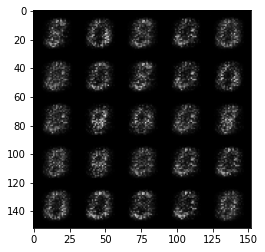

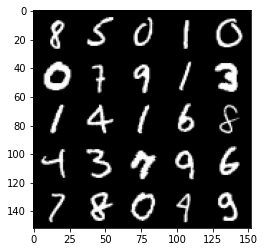

Step 2500: Generator loss: 1.700757867336273, discriminator loss: 0.2058914775252342


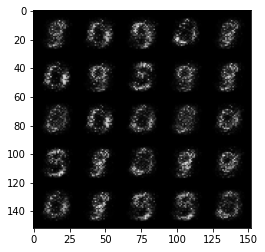

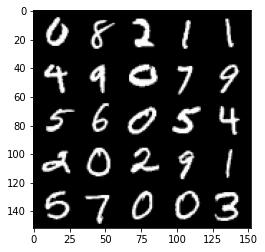

Step 3000: Generator loss: 1.983260810375215, discriminator loss: 0.16021677877008897


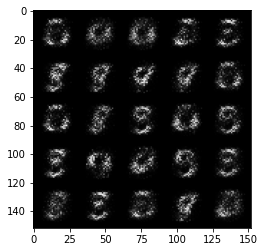

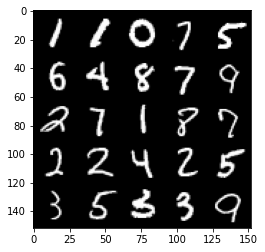

Step 3500: Generator loss: 2.3948398275375373, discriminator loss: 0.12074891766905792


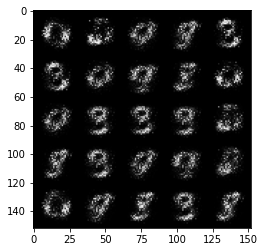

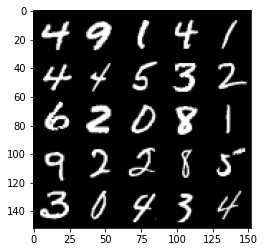

Step 4000: Generator loss: 2.9044197487831136, discriminator loss: 0.08892298610508438


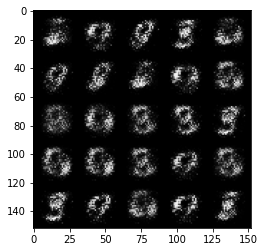

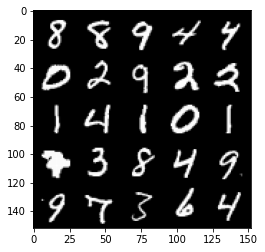

Step 4500: Generator loss: 3.312939853191375, discriminator loss: 0.07128307662159207


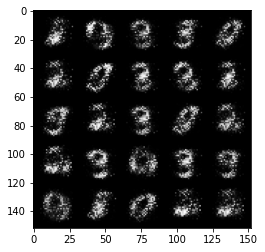

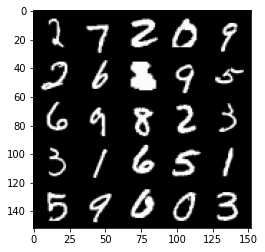

Step 5000: Generator loss: 3.644830444335935, discriminator loss: 0.06592129294574262


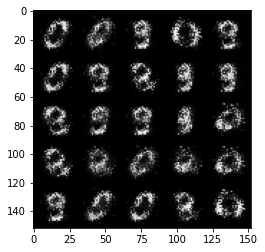

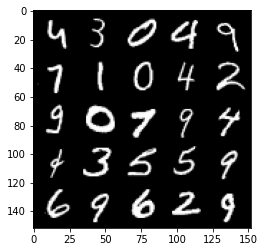

Step 5500: Generator loss: 3.8701814994811987, discriminator loss: 0.06917184223234651


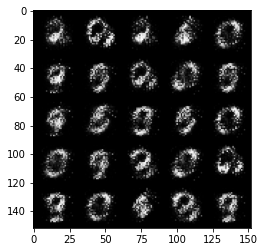

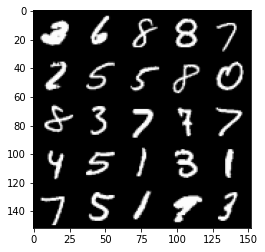

Step 6000: Generator loss: 3.858536848068234, discriminator loss: 0.05631308940052985


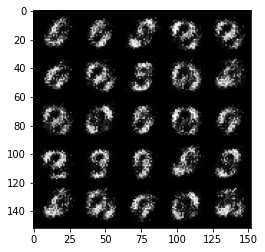

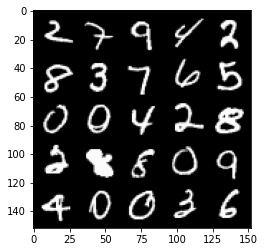

Step 6500: Generator loss: 4.267449837207795, discriminator loss: 0.045851990517228845


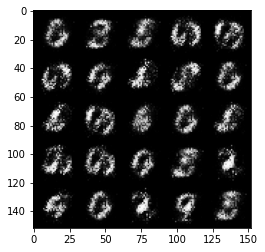

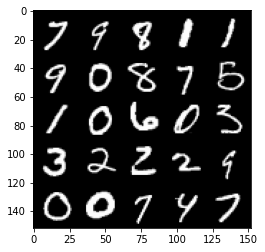

Step 7000: Generator loss: 4.1842310166358985, discriminator loss: 0.04556581411510706


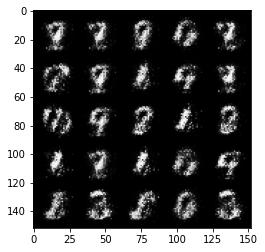

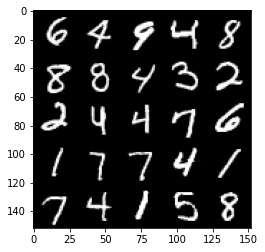

Step 7500: Generator loss: 4.124337267875678, discriminator loss: 0.04936009667441248


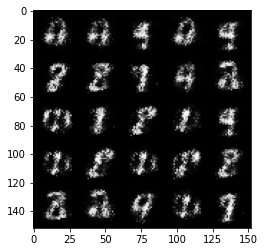

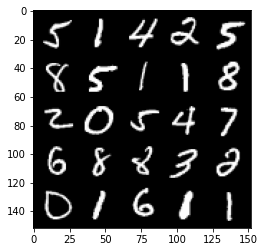

Step 8000: Generator loss: 3.842518754005426, discriminator loss: 0.06196043118461964


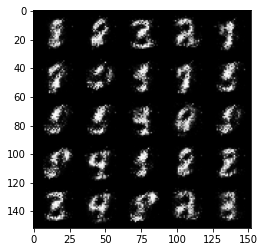

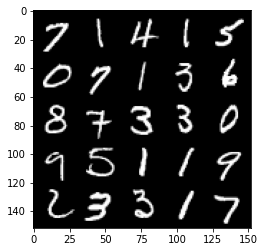

Step 8500: Generator loss: 4.077046313762665, discriminator loss: 0.0506419492326677


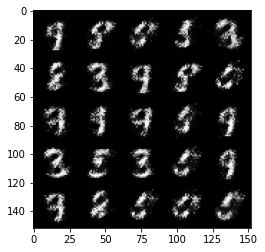

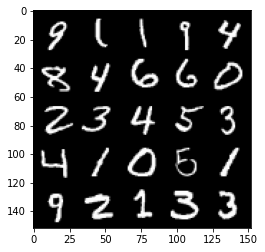

Step 9000: Generator loss: 4.00261770582199, discriminator loss: 0.051831022340804354


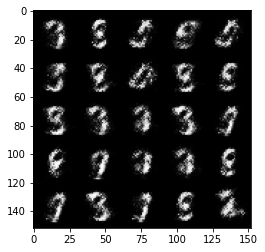

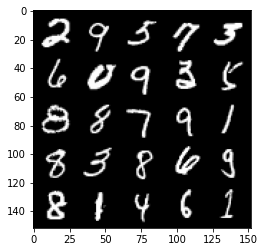

Step 9500: Generator loss: 3.898944074153899, discriminator loss: 0.06406931871548302


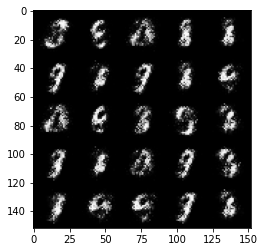

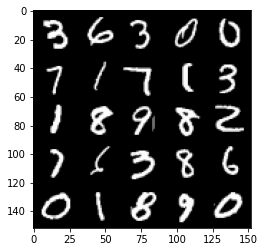

Step 10000: Generator loss: 4.166308532238003, discriminator loss: 0.056239948052912984


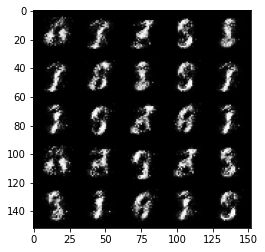

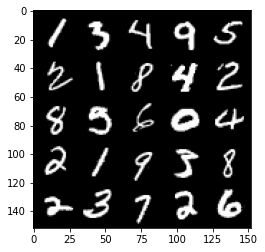

Step 10500: Generator loss: 4.178450506210321, discriminator loss: 0.05034695820510385


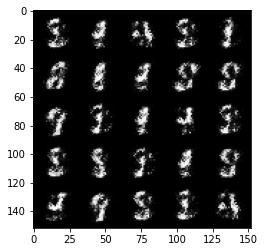

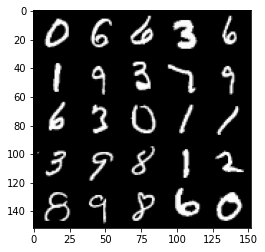

Step 11000: Generator loss: 4.257294734477997, discriminator loss: 0.05224399901926517


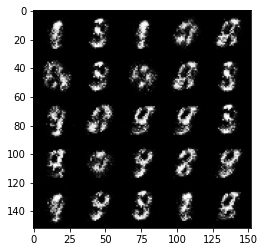

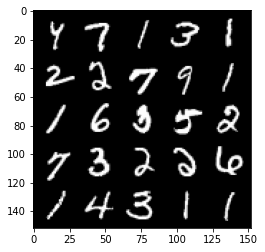

Step 11500: Generator loss: 3.989614725589753, discriminator loss: 0.07167365810275082


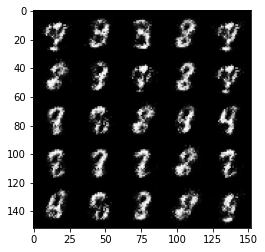

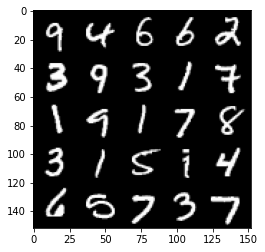

Step 12000: Generator loss: 3.9679861598014856, discriminator loss: 0.07303021344169974


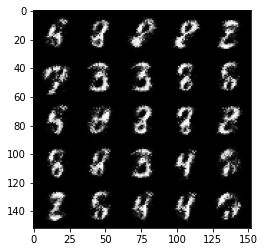

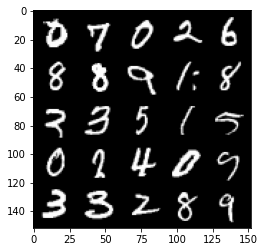

Step 12500: Generator loss: 3.7837456183433567, discriminator loss: 0.08399359232932335


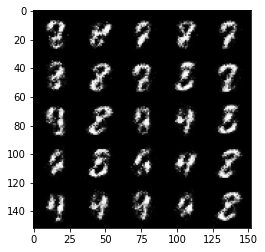

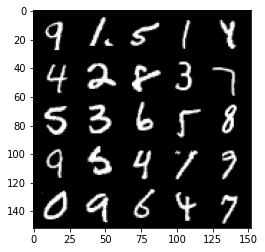

Step 13000: Generator loss: 3.7335835866928115, discriminator loss: 0.08572893087565904


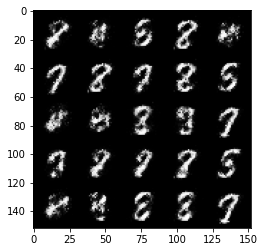

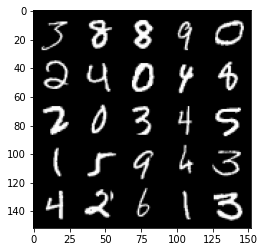

Step 13500: Generator loss: 3.9052684669494653, discriminator loss: 0.09047014359384777


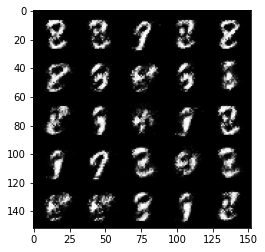

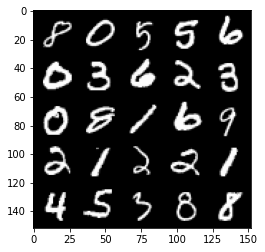

Step 14000: Generator loss: 3.964803189754485, discriminator loss: 0.10154388236999501


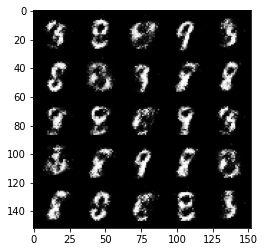

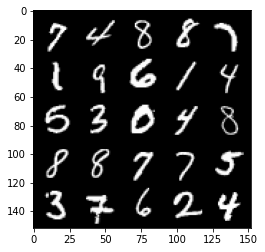

Step 14500: Generator loss: 3.7705258340835566, discriminator loss: 0.09799301691353324


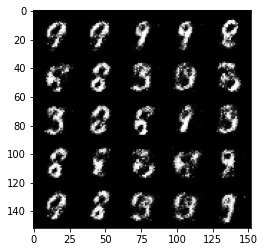

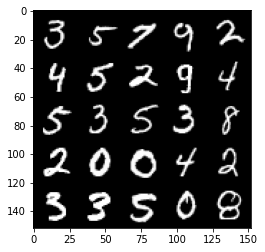

Step 15000: Generator loss: 3.7910939564704917, discriminator loss: 0.09949260112643248


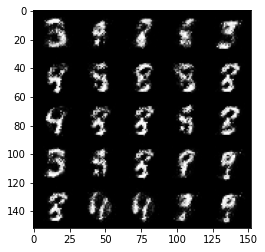

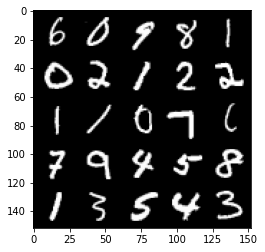

Step 15500: Generator loss: 3.7066503124237076, discriminator loss: 0.10572675215452905


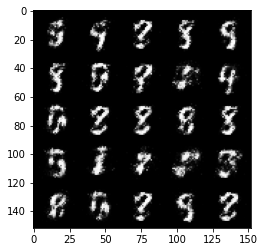

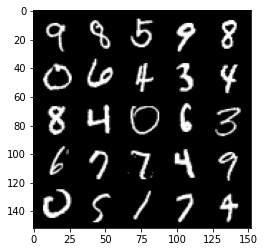

Step 16000: Generator loss: 3.631771944046017, discriminator loss: 0.12254080957174299


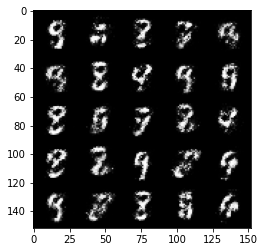

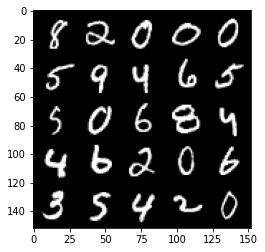

Step 16500: Generator loss: 3.6914788408279398, discriminator loss: 0.12471304504573345


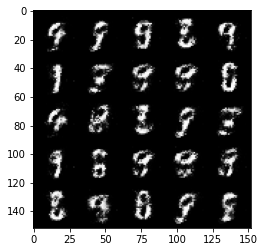

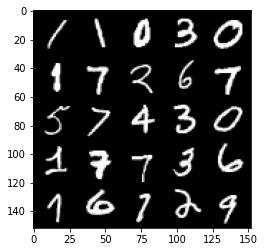

Step 17000: Generator loss: 3.4563097028732295, discriminator loss: 0.12812732722610226


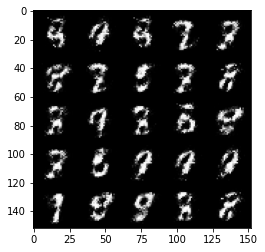

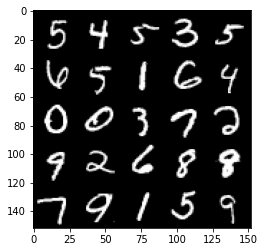

Step 17500: Generator loss: 3.5808586597442615, discriminator loss: 0.12411337511986488


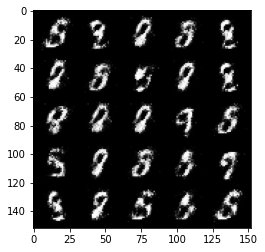

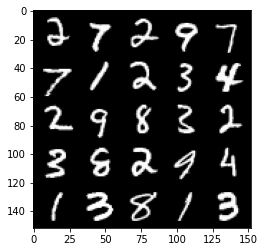

Step 18000: Generator loss: 3.651425230503084, discriminator loss: 0.11826048927009113


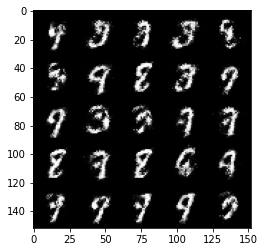

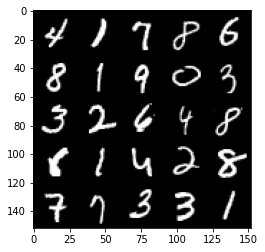

Step 18500: Generator loss: 3.3254896602630613, discriminator loss: 0.13879230014234784


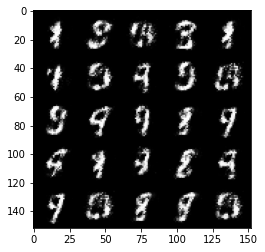

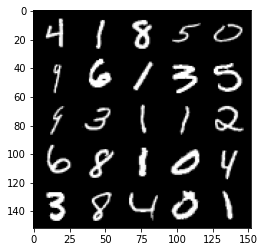

Step 19000: Generator loss: 3.3203238248825047, discriminator loss: 0.12733544677495964


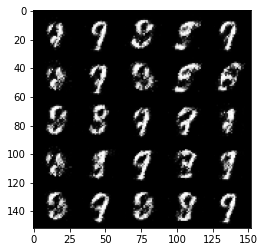

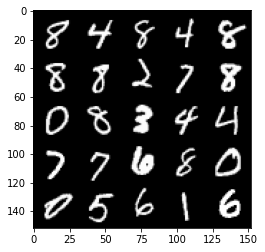

Step 19500: Generator loss: 3.493732216358181, discriminator loss: 0.13515543444454667


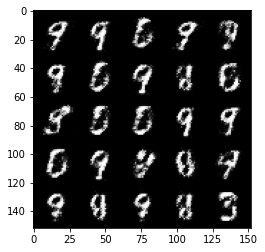

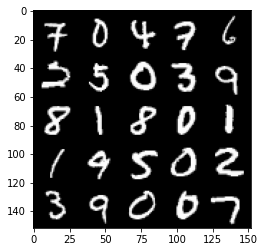

Step 20000: Generator loss: 3.330478682994844, discriminator loss: 0.14816735525429234


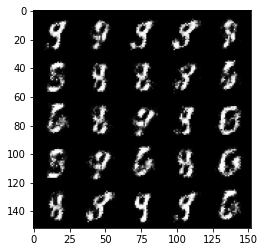

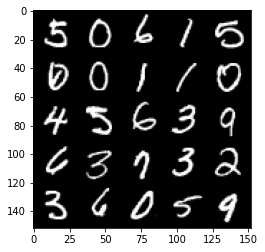

Step 20500: Generator loss: 3.3594691634178155, discriminator loss: 0.14719147427380094


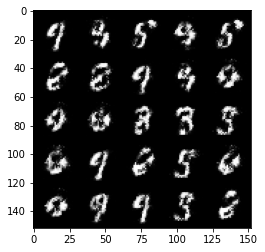

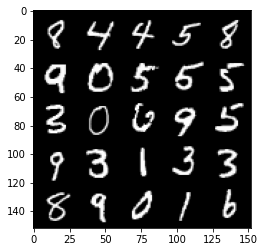

Step 21000: Generator loss: 3.303622686862947, discriminator loss: 0.14326382030546647


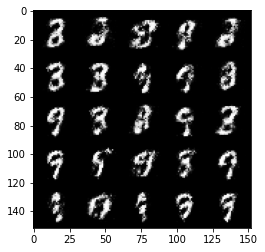

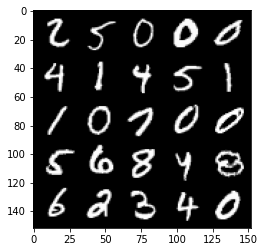

Step 21500: Generator loss: 3.449764357566837, discriminator loss: 0.14796991799771791


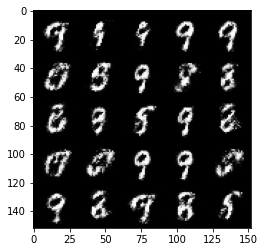

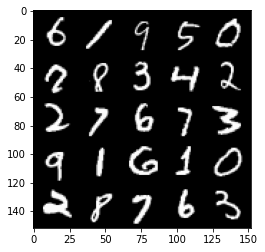

Step 22000: Generator loss: 3.1710304427146925, discriminator loss: 0.1792030584812164


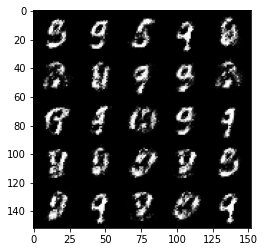

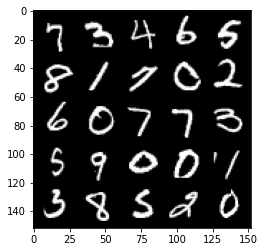

Step 22500: Generator loss: 3.204594646930693, discriminator loss: 0.17132040272653098


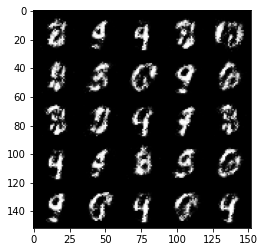

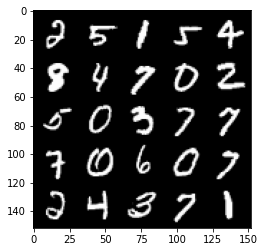

Step 23000: Generator loss: 3.253523721218108, discriminator loss: 0.1825676370859146


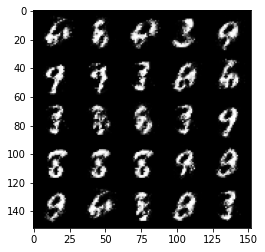

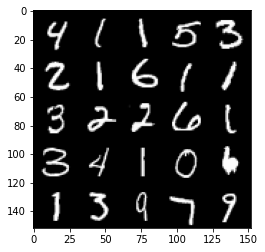

Step 23500: Generator loss: 3.1397878055572463, discriminator loss: 0.17088694687187667


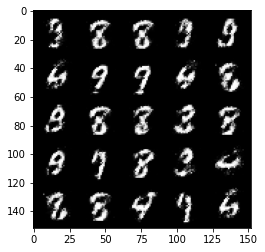

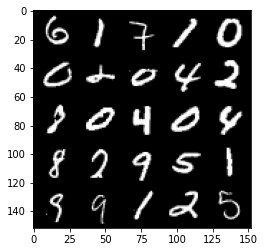

Step 24000: Generator loss: 3.2415495204925553, discriminator loss: 0.15993790908157823


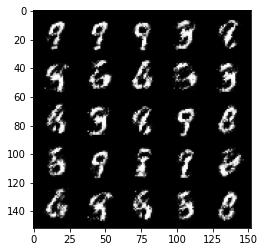

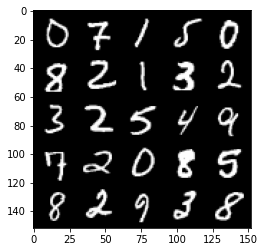

Step 24500: Generator loss: 3.060205819606781, discriminator loss: 0.18101264660060415


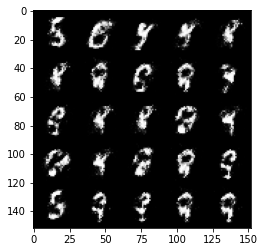

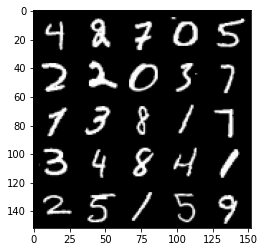

Step 25000: Generator loss: 3.2344605455398594, discriminator loss: 0.1596975617706776


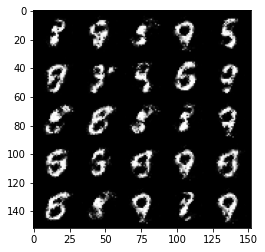

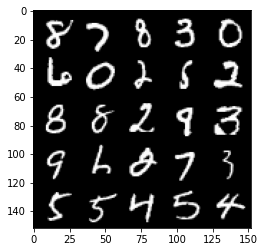

Step 25500: Generator loss: 3.1703701572418184, discriminator loss: 0.16896619416773317


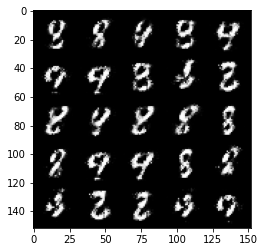

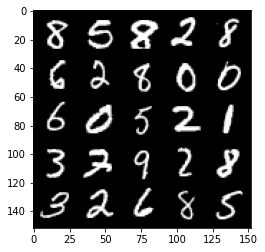

Step 26000: Generator loss: 3.0690922532081615, discriminator loss: 0.17464616650342954


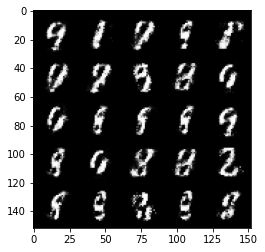

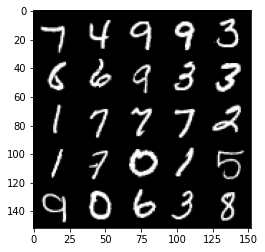

Step 26500: Generator loss: 3.161447519302365, discriminator loss: 0.17648955371975894


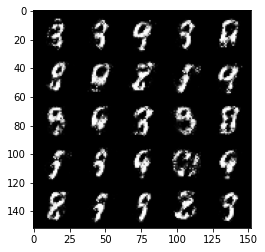

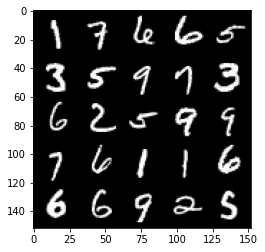

Step 27000: Generator loss: 3.1248264646530157, discriminator loss: 0.18104662425816057


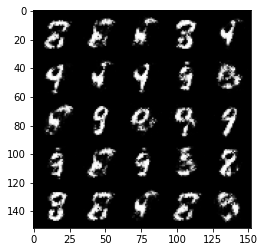

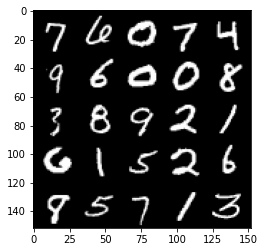

Step 27500: Generator loss: 3.079476257801056, discriminator loss: 0.17130496636033057


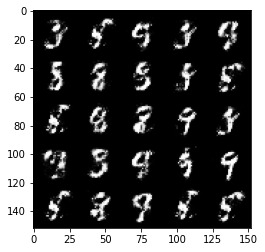

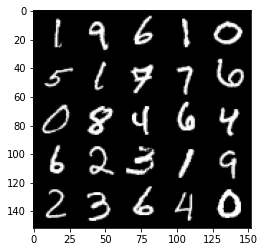

Step 28000: Generator loss: 3.040168117523195, discriminator loss: 0.1793371150195598


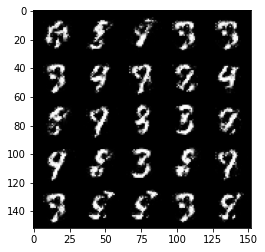

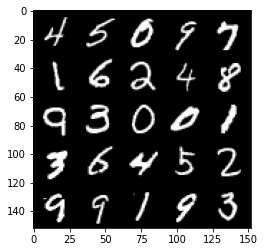

Step 28500: Generator loss: 3.020809682846069, discriminator loss: 0.1915863752812146


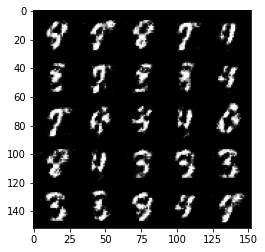

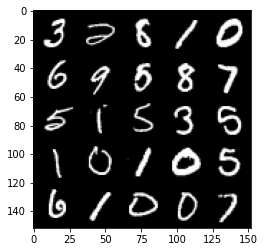

Step 29000: Generator loss: 2.7345616140365596, discriminator loss: 0.23072957780957232


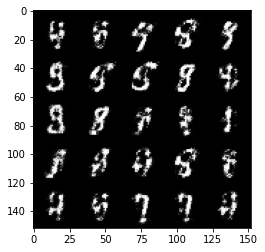

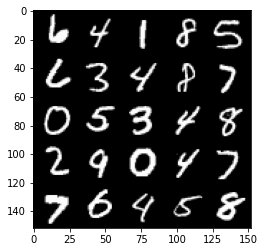

Step 29500: Generator loss: 2.9174733076095576, discriminator loss: 0.19814956690371038


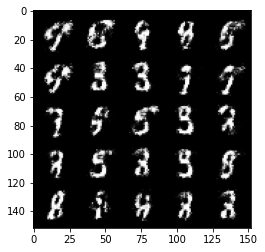

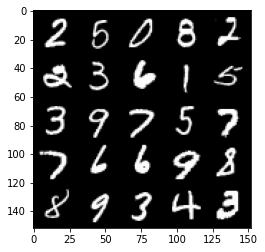

Step 30000: Generator loss: 3.064078279018403, discriminator loss: 0.18408748383820048


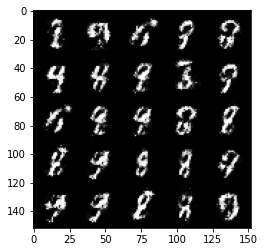

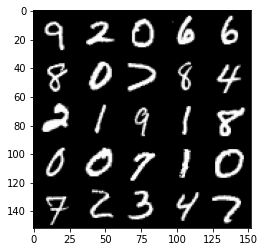

Step 30500: Generator loss: 2.7179226059913653, discriminator loss: 0.2151303539425133


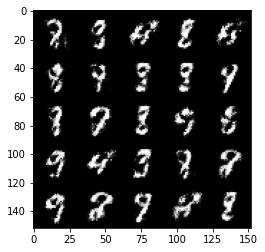

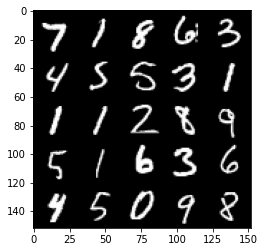

Step 31000: Generator loss: 2.8928797664642314, discriminator loss: 0.18548657478392125


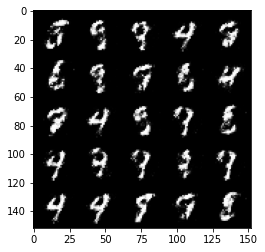

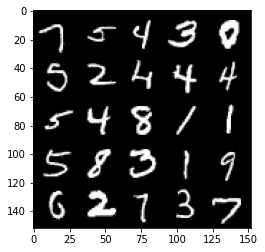

Step 31500: Generator loss: 2.831283229351046, discriminator loss: 0.20183855631947525


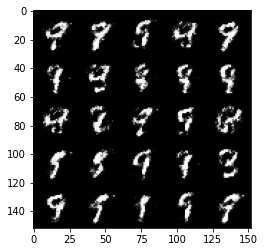

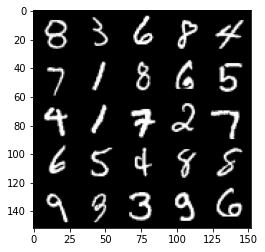

Step 32000: Generator loss: 2.9439814453125037, discriminator loss: 0.1835200849473477


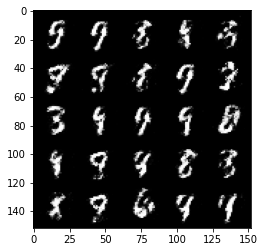

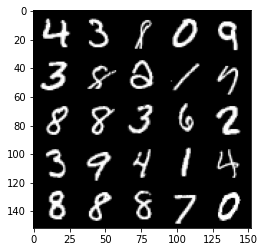

Step 32500: Generator loss: 2.842824395656584, discriminator loss: 0.20185357753932479


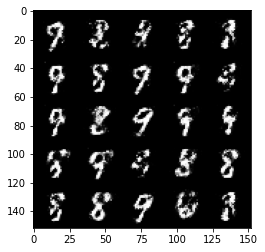

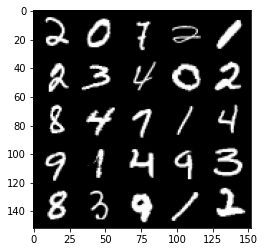

Step 33000: Generator loss: 2.7717085404396085, discriminator loss: 0.20970439024269577


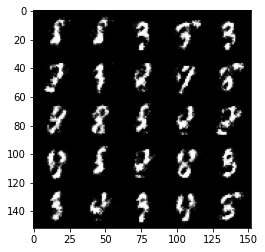

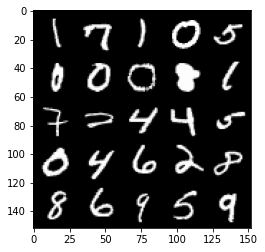

Step 33500: Generator loss: 2.7338258023262023, discriminator loss: 0.20197035510838043


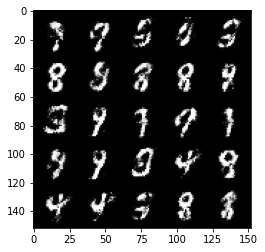

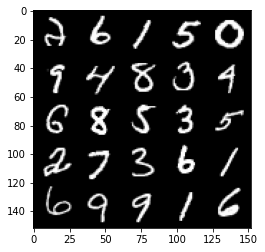

Step 34000: Generator loss: 2.780332889556888, discriminator loss: 0.21966959330439573


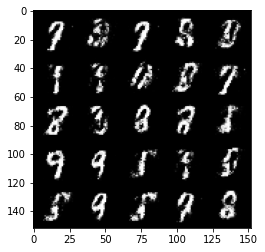

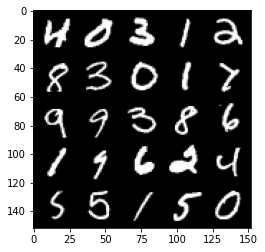

Step 34500: Generator loss: 2.7021310129165657, discriminator loss: 0.21287515002489085


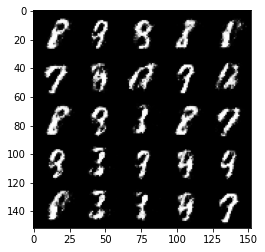

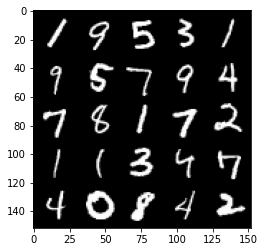

Step 35000: Generator loss: 2.687151678562168, discriminator loss: 0.23203982524573796


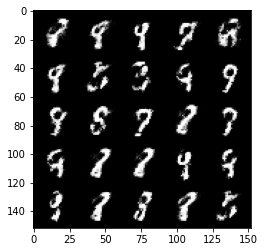

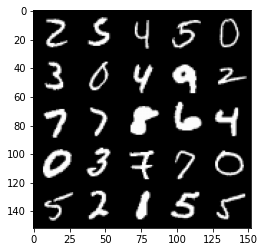

Step 35500: Generator loss: 2.5924309206008918, discriminator loss: 0.2506688619554042


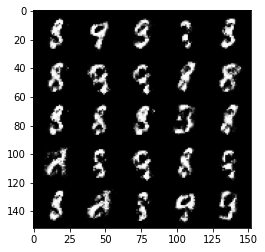

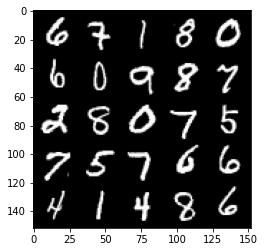

Step 36000: Generator loss: 2.549561294555665, discriminator loss: 0.23600381389260297


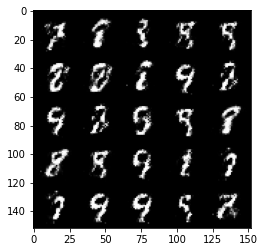

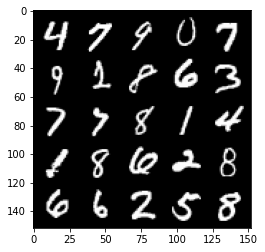

Step 36500: Generator loss: 2.524073496341705, discriminator loss: 0.24563045148551463


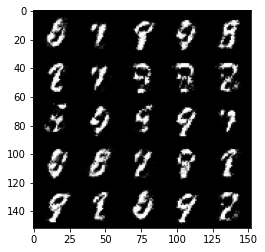

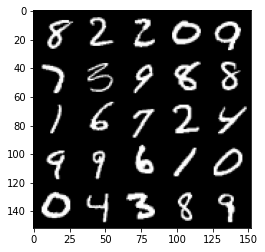

Step 37000: Generator loss: 2.645217811584472, discriminator loss: 0.22970635476708423


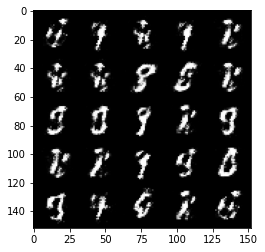

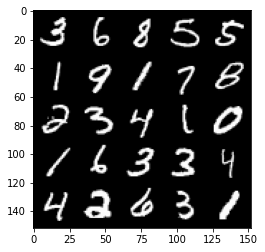

Step 37500: Generator loss: 2.6414901967048645, discriminator loss: 0.22971295550465584


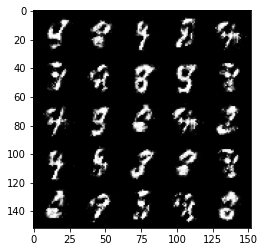

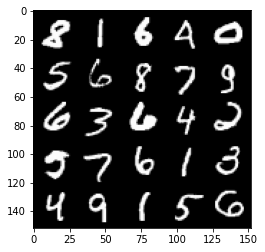

Step 38000: Generator loss: 2.5576141510009767, discriminator loss: 0.24422389179468154


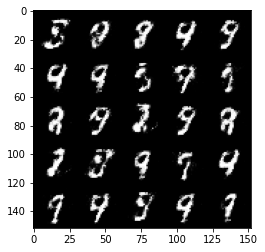

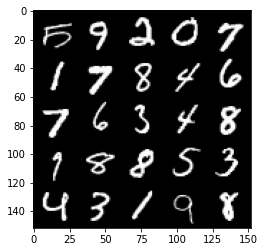

Step 38500: Generator loss: 2.5601699948310856, discriminator loss: 0.24327651488780974


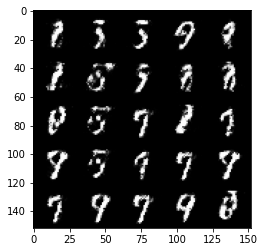

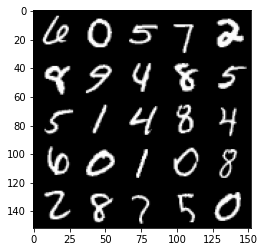

Step 39000: Generator loss: 2.525128144264224, discriminator loss: 0.24023419192433348


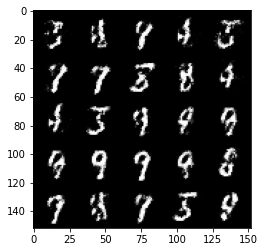

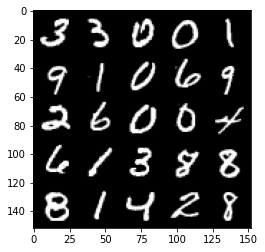

Step 39500: Generator loss: 2.518264498710631, discriminator loss: 0.242822780996561


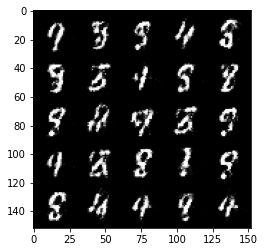

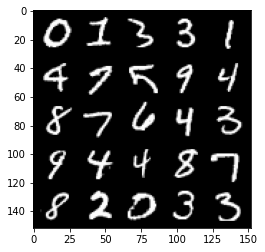

Step 40000: Generator loss: 2.3755861594676992, discriminator loss: 0.26816904476284986


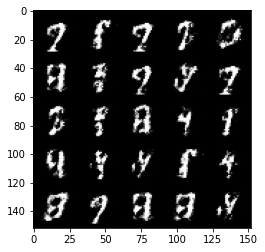

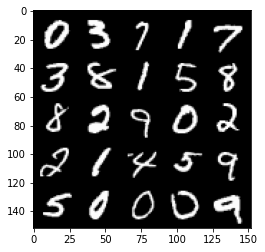

Step 40500: Generator loss: 2.505859101772309, discriminator loss: 0.23262129274010634


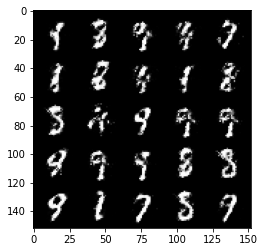

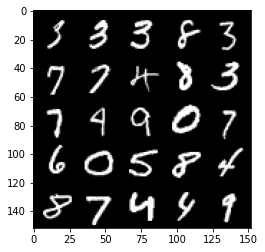

Step 41000: Generator loss: 2.4870506763458247, discriminator loss: 0.2370033177137374


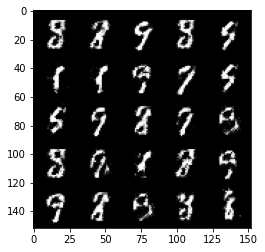

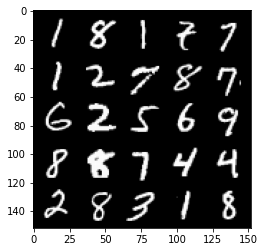

Step 41500: Generator loss: 2.4525475549697875, discriminator loss: 0.24441490849852557


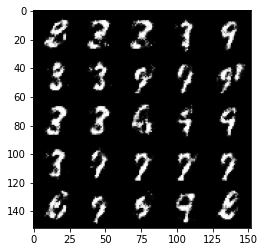

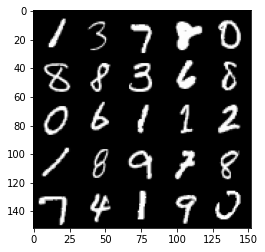

Step 42000: Generator loss: 2.454887946128847, discriminator loss: 0.25656667920947046


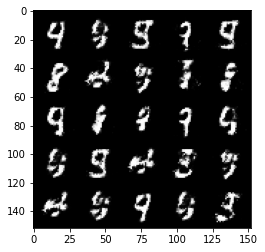

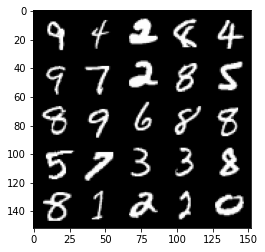

Step 42500: Generator loss: 2.419099503517149, discriminator loss: 0.25715214169025413


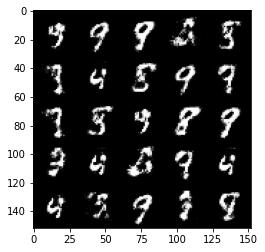

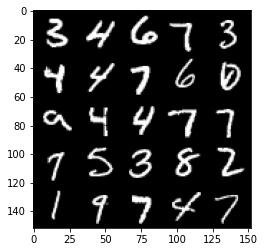

Step 43000: Generator loss: 2.2635636229515095, discriminator loss: 0.28071124610304854


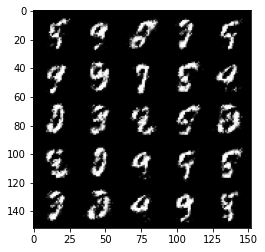

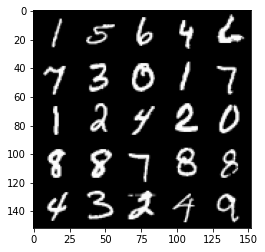

Step 43500: Generator loss: 2.3735376684665663, discriminator loss: 0.274543105125427


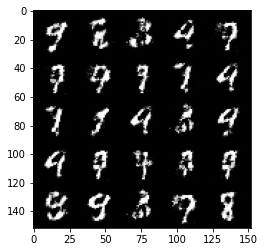

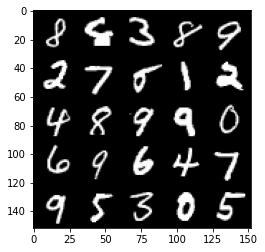

Step 44000: Generator loss: 2.3725117220878587, discriminator loss: 0.26157143491506585


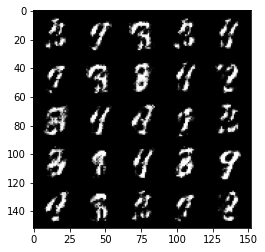

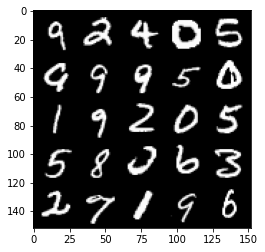

Step 44500: Generator loss: 2.375263790607453, discriminator loss: 0.27190661963820445


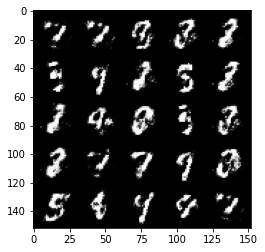

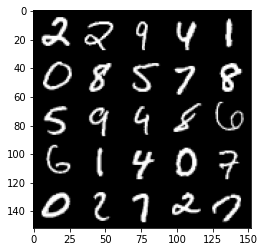

Step 45000: Generator loss: 2.363615396499633, discriminator loss: 0.26872703757882116


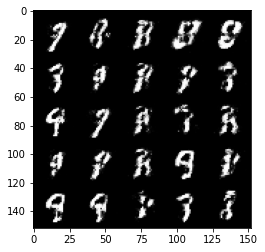

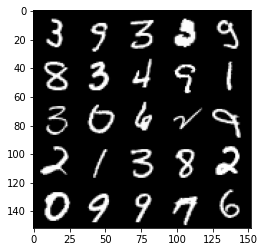

Step 45500: Generator loss: 2.309741297960282, discriminator loss: 0.2764770535826685


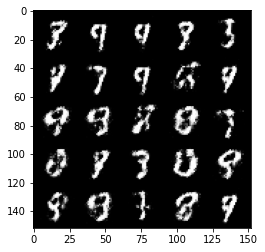

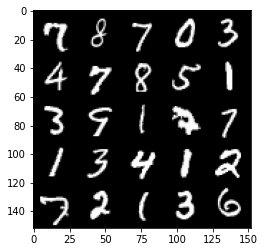

Step 46000: Generator loss: 2.418496390342714, discriminator loss: 0.24596271994709973


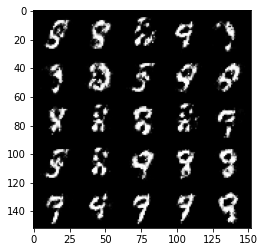

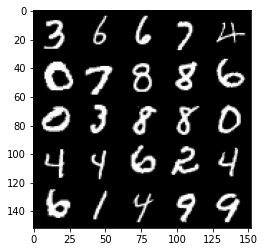

Step 46500: Generator loss: 2.44542949795723, discriminator loss: 0.24947618791460974


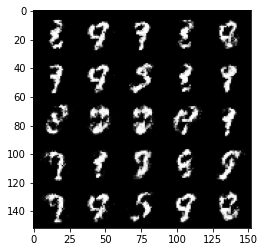

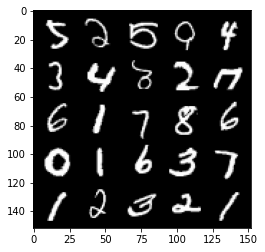

Step 47000: Generator loss: 2.3384334735870373, discriminator loss: 0.25908347579836843


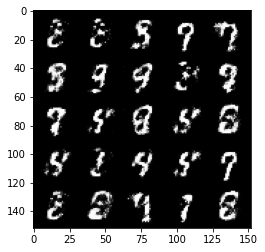

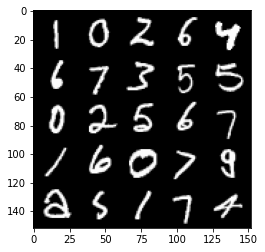

Step 47500: Generator loss: 2.360733833789825, discriminator loss: 0.2662388238310815


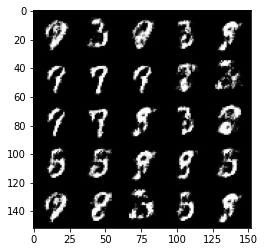

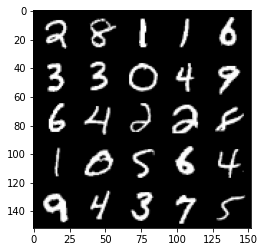

Step 48000: Generator loss: 2.2077528223991383, discriminator loss: 0.2891962232589721


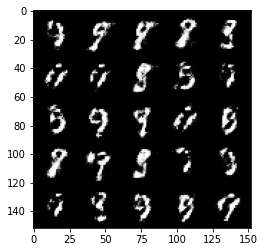

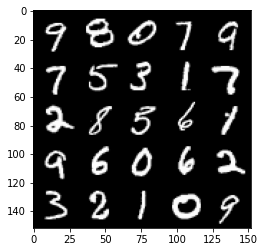

Step 48500: Generator loss: 2.3773709142208106, discriminator loss: 0.2667413105368614


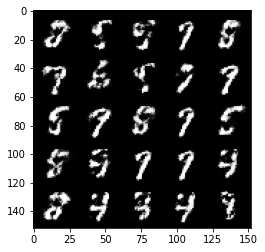

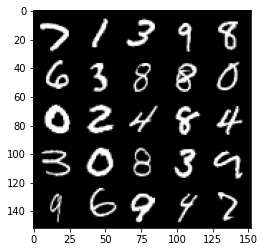

Step 49000: Generator loss: 2.1944389569759344, discriminator loss: 0.2875894536376001


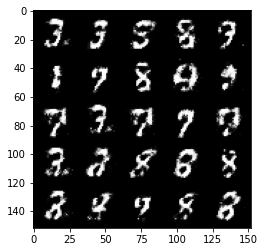

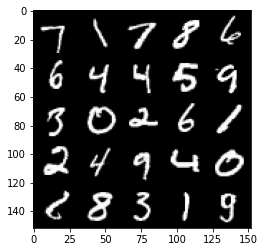

Step 49500: Generator loss: 2.303138926744461, discriminator loss: 0.2772479530572893


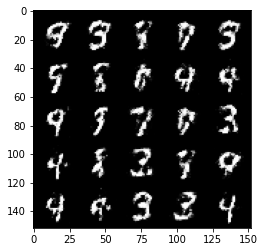

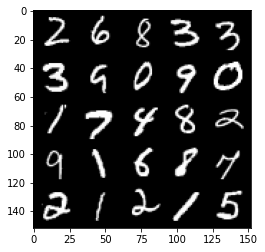

Step 50000: Generator loss: 2.2879731292724608, discriminator loss: 0.269723370552063


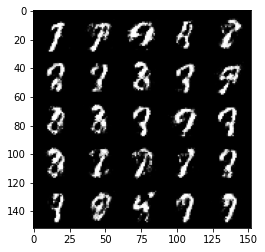

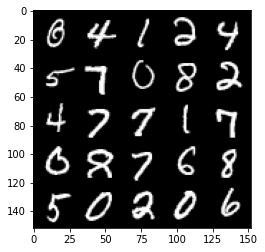

Step 50500: Generator loss: 2.1768446874618537, discriminator loss: 0.29001327499747276


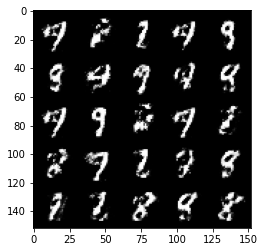

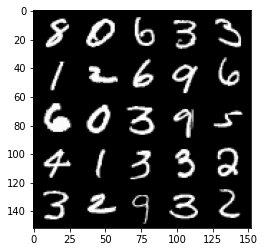

Step 51000: Generator loss: 2.1860454502105746, discriminator loss: 0.2935900748670102


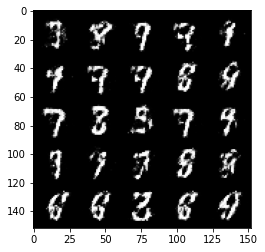

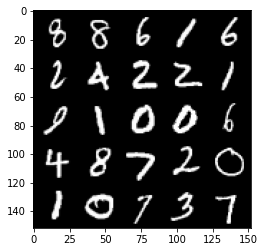

Step 51500: Generator loss: 2.1190697588920595, discriminator loss: 0.3130673995316028


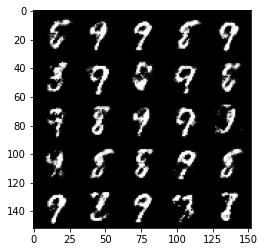

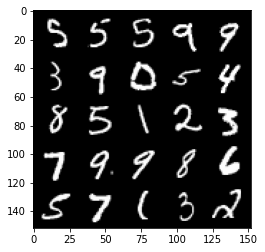

Step 52000: Generator loss: 2.0922945489883413, discriminator loss: 0.3155455220043659


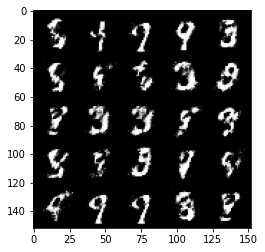

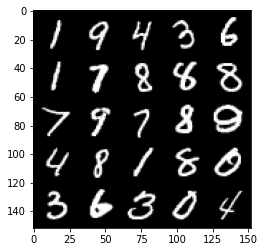

Step 52500: Generator loss: 2.107266274690626, discriminator loss: 0.29438607805967326


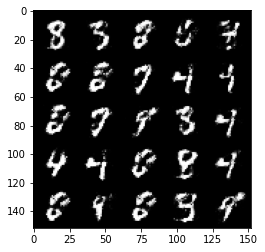

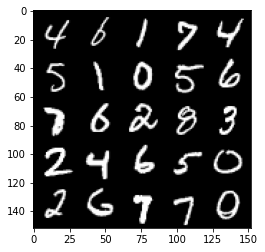

Step 53000: Generator loss: 2.1061777832508075, discriminator loss: 0.3081094129681586


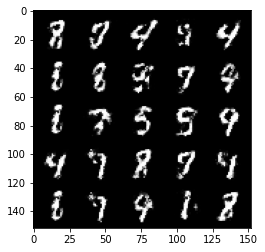

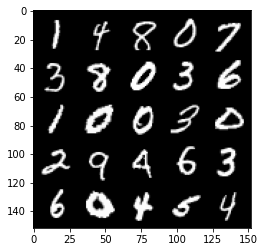

Step 53500: Generator loss: 2.0248244652748104, discriminator loss: 0.3184046472012997


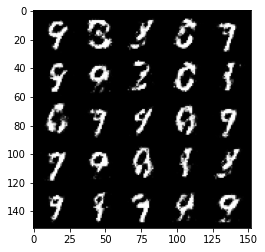

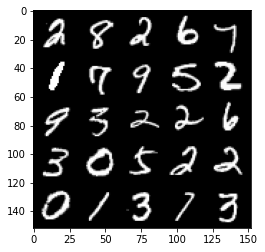

Step 54000: Generator loss: 1.997098150968551, discriminator loss: 0.3233698018193248


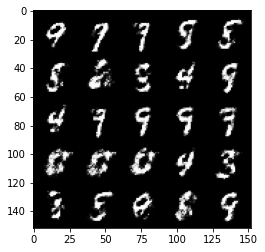

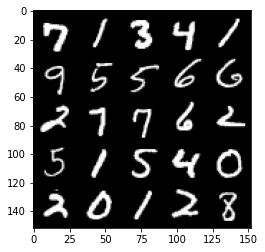

Step 54500: Generator loss: 1.9911258378028873, discriminator loss: 0.3348349880278111


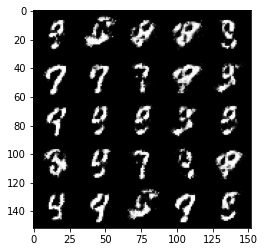

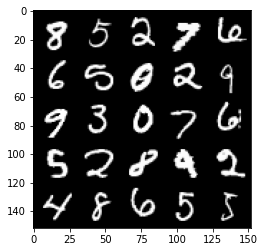

Step 55000: Generator loss: 2.060880576610565, discriminator loss: 0.3137792087495328


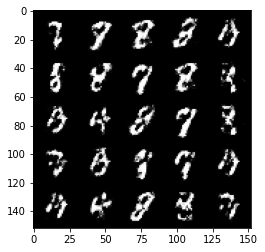

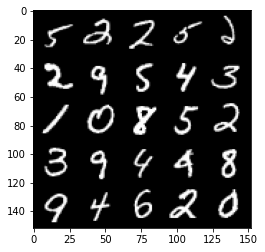

Step 55500: Generator loss: 2.10947621202469, discriminator loss: 0.29160125699639294


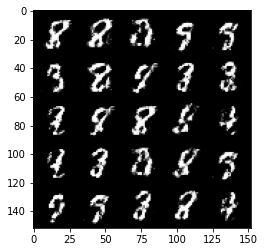

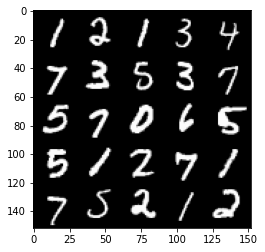

Step 56000: Generator loss: 2.215970534324646, discriminator loss: 0.2768327459394932


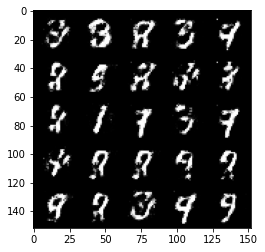

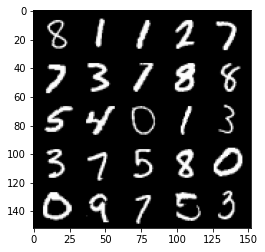

Step 56500: Generator loss: 2.083861117839814, discriminator loss: 0.3031324483752251


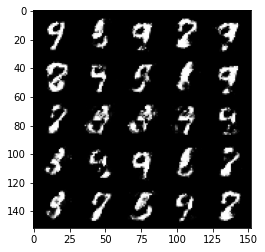

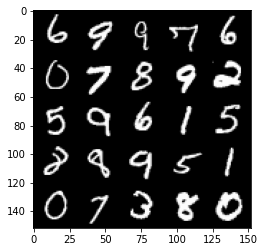

Step 57000: Generator loss: 2.061970515251159, discriminator loss: 0.2964168716669082


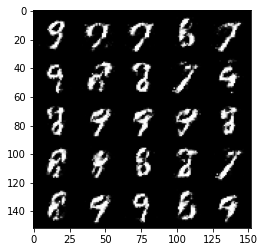

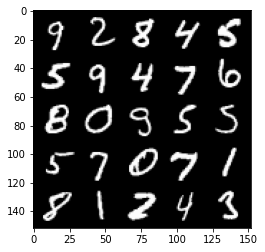

Step 57500: Generator loss: 2.1040041275024404, discriminator loss: 0.2904855543076988


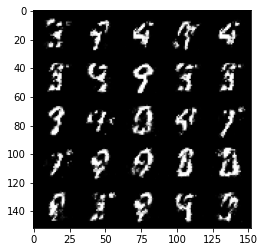

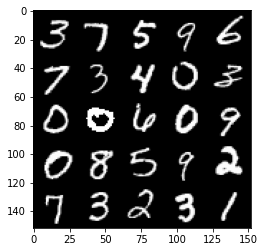

Step 58000: Generator loss: 2.062042163133621, discriminator loss: 0.3143773406147954


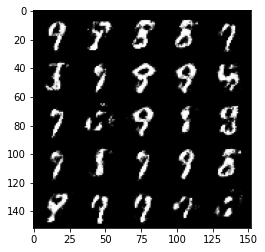

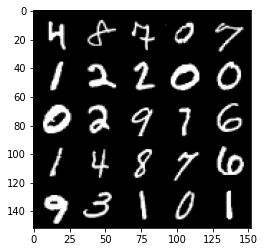

Step 58500: Generator loss: 2.0084973621368385, discriminator loss: 0.32667817673087085


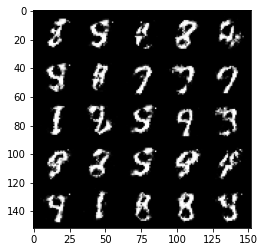

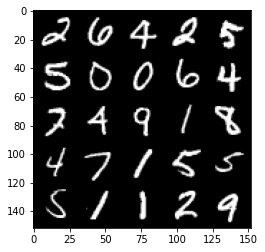

Step 59000: Generator loss: 1.9618687806129445, discriminator loss: 0.3253025086820125


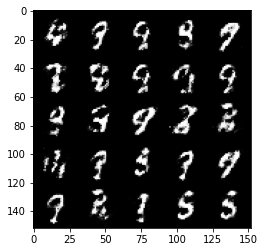

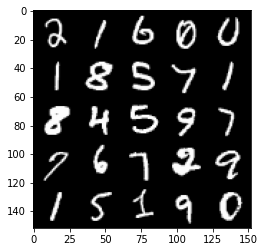

Step 59500: Generator loss: 1.9216754822731021, discriminator loss: 0.34819401508569753


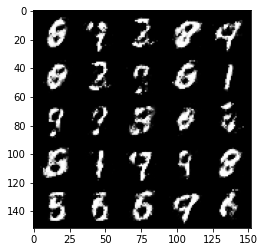

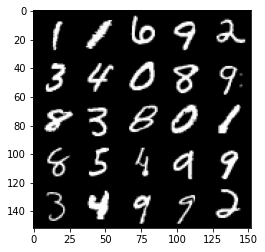

Step 60000: Generator loss: 1.8123913707733168, discriminator loss: 0.36878116613626455


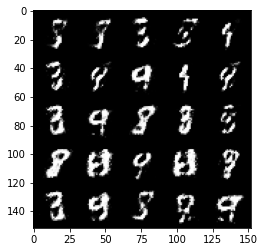

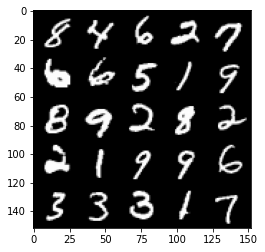

Step 60500: Generator loss: 1.9036310524940487, discriminator loss: 0.331134682238102


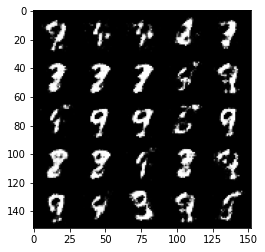

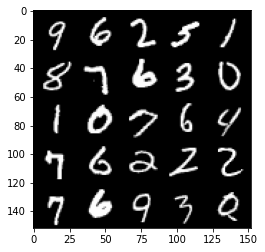

Step 61000: Generator loss: 2.0793528602123255, discriminator loss: 0.29647606977820373


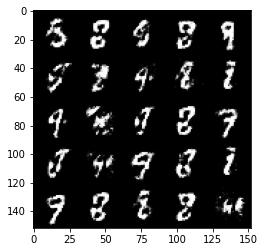

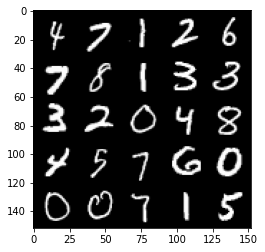

Step 61500: Generator loss: 1.9375734491348264, discriminator loss: 0.31802482128143333


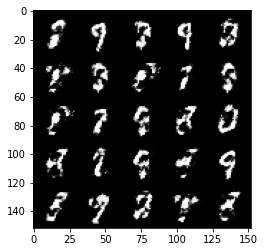

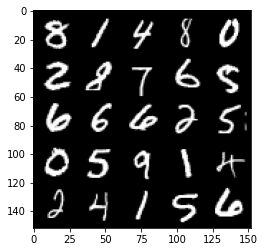

Step 62000: Generator loss: 2.058805186271668, discriminator loss: 0.3100965240895748


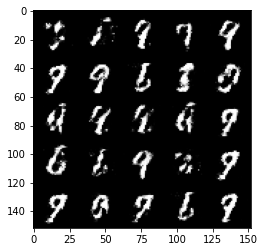

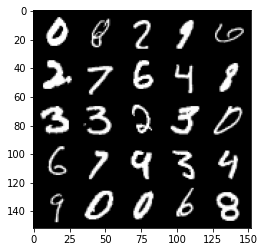

Step 62500: Generator loss: 1.8344304141998302, discriminator loss: 0.34805827116966254


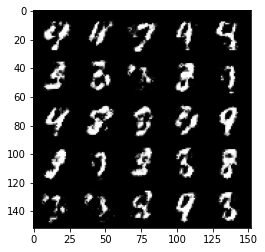

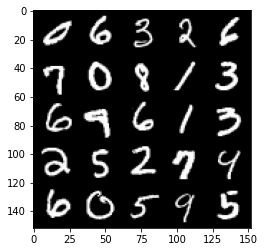

Step 63000: Generator loss: 1.8508207831382761, discriminator loss: 0.34685154929757106


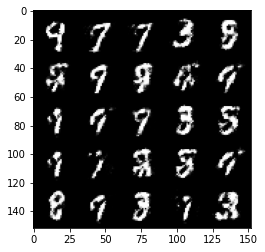

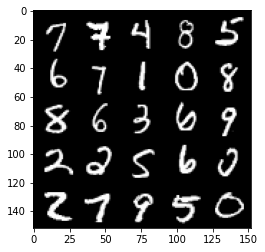

Step 63500: Generator loss: 1.711344797611235, discriminator loss: 0.3797944534420966


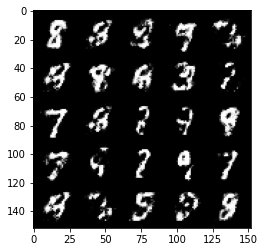

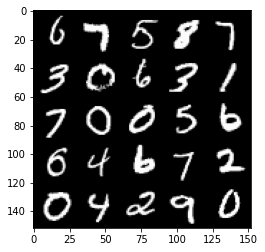

Step 64000: Generator loss: 1.7390321230888373, discriminator loss: 0.37269414073228824


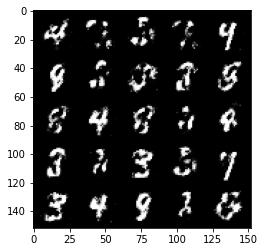

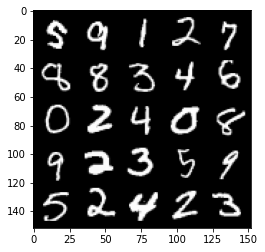

Step 64500: Generator loss: 1.7037883198261272, discriminator loss: 0.3861383822560314


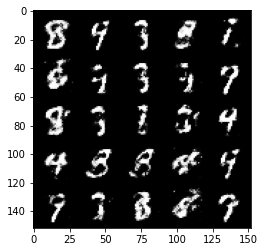

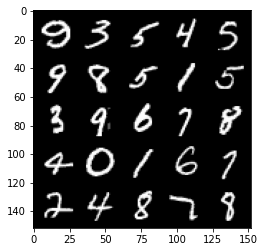

Step 65000: Generator loss: 1.6326500315666195, discriminator loss: 0.3912648960351941


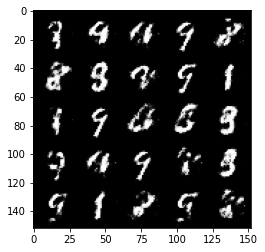

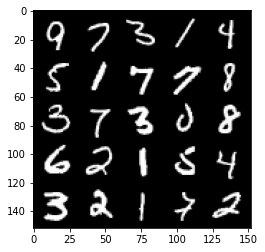

Step 65500: Generator loss: 1.7185851655006417, discriminator loss: 0.3757043573260308


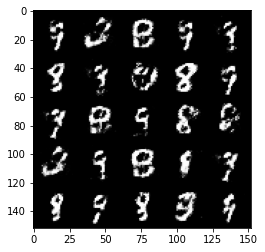

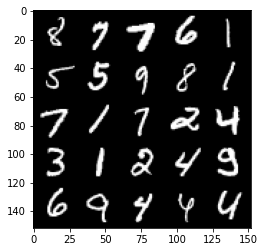

Step 66000: Generator loss: 1.7408871724605566, discriminator loss: 0.37891253733634933


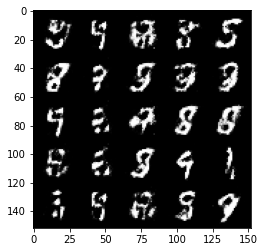

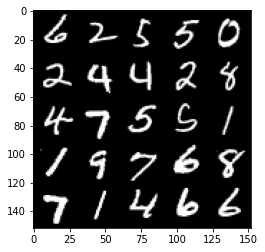

Step 66500: Generator loss: 1.742249634742735, discriminator loss: 0.38322103911638217


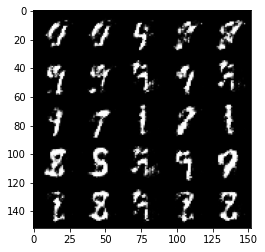

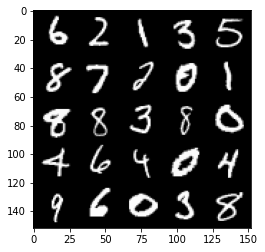

Step 67000: Generator loss: 1.7064866933822638, discriminator loss: 0.38445513606071485


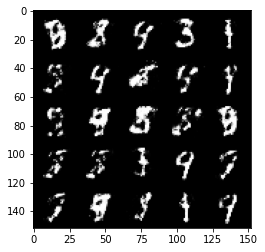

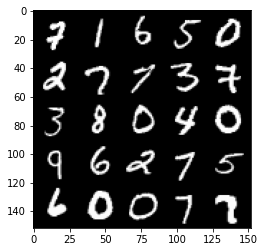

Step 67500: Generator loss: 1.6727649810314167, discriminator loss: 0.3785636150240899


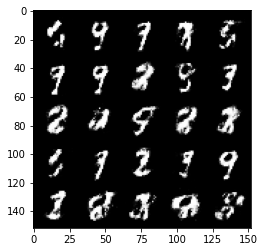

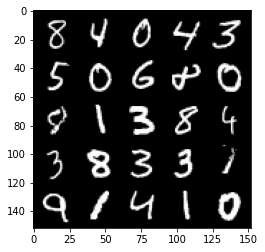

Step 68000: Generator loss: 1.7118870310783392, discriminator loss: 0.3743626824617385


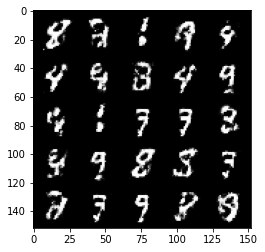

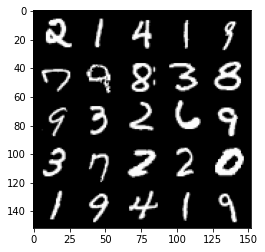

Step 68500: Generator loss: 1.7677942667007454, discriminator loss: 0.3661583663821222


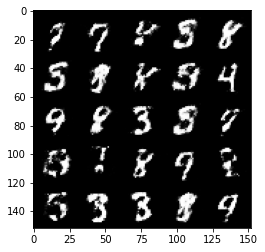

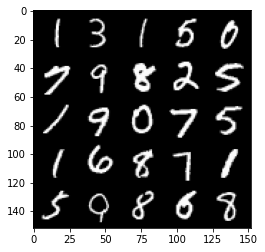

Step 69000: Generator loss: 1.6179732918739307, discriminator loss: 0.4065708039402969


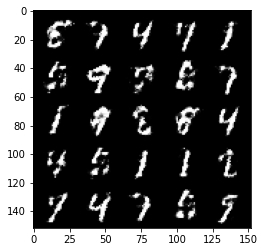

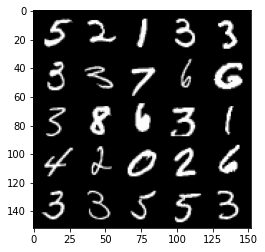

Step 69500: Generator loss: 1.6406623950004577, discriminator loss: 0.39349882930517205


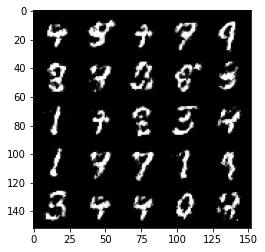

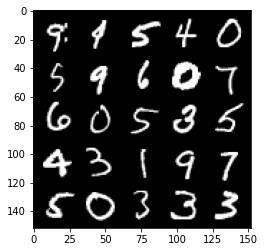

Step 70000: Generator loss: 1.8060317471027385, discriminator loss: 0.36142995047569243


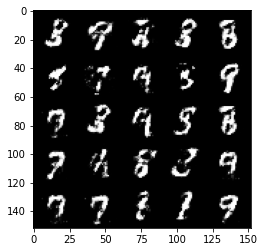

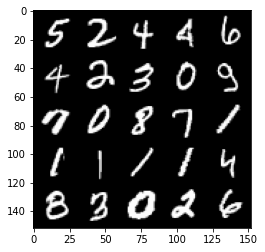

Step 70500: Generator loss: 1.6473708267211935, discriminator loss: 0.3949718599915508


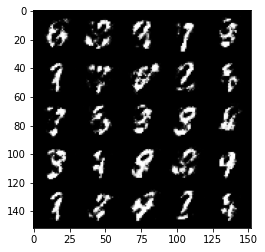

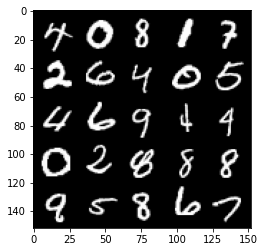

Step 71000: Generator loss: 1.6905485944747924, discriminator loss: 0.37093554037809373


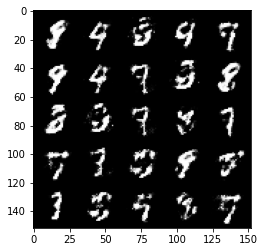

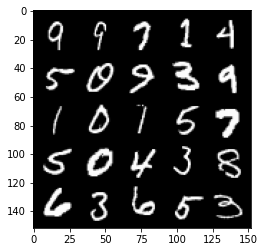

Step 71500: Generator loss: 1.6857980210781114, discriminator loss: 0.38457177853584323


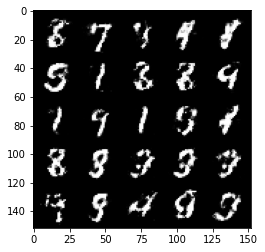

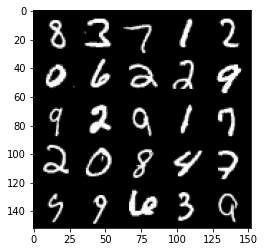

Step 72000: Generator loss: 1.627039093494415, discriminator loss: 0.3834251689314842


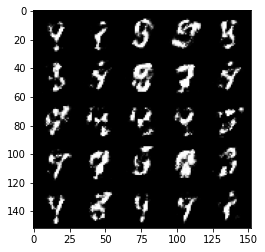

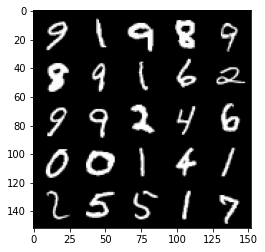

Step 72500: Generator loss: 1.6456949326992028, discriminator loss: 0.37862338125705725


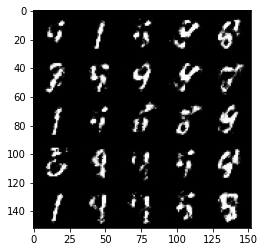

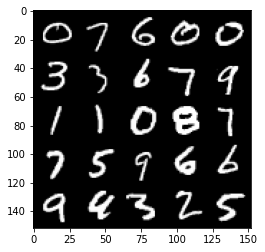

Step 73000: Generator loss: 1.671318937301635, discriminator loss: 0.3684565538167953


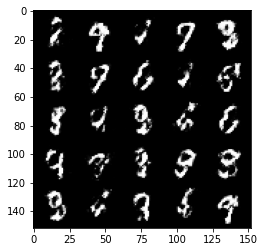

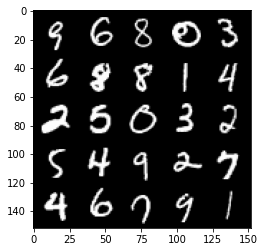

Step 73500: Generator loss: 1.6874560010433204, discriminator loss: 0.36728557777404763


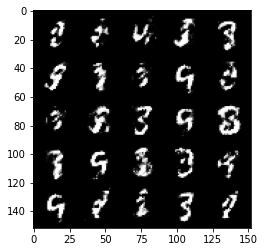

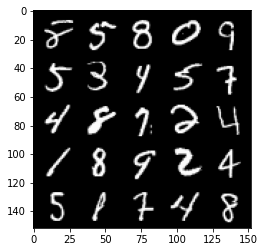

Step 74000: Generator loss: 1.6661709821224213, discriminator loss: 0.37294322398304913


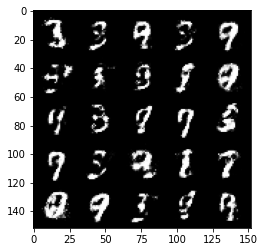

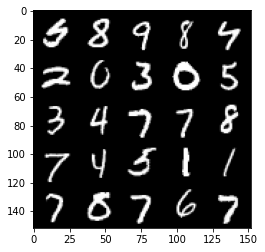

Step 74500: Generator loss: 1.694986263513564, discriminator loss: 0.3668955708146092


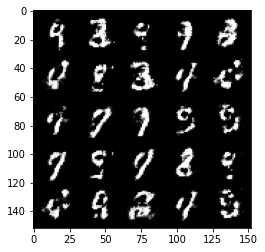

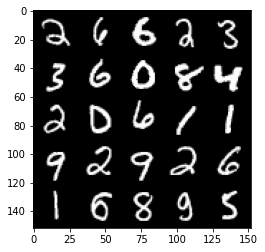

Step 75000: Generator loss: 1.7047402415275592, discriminator loss: 0.3721487761735918


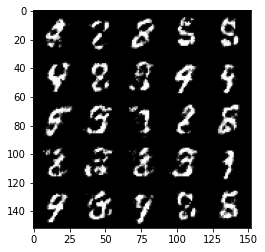

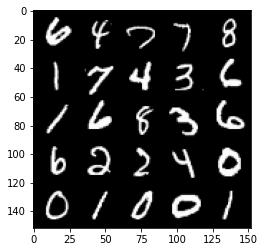

Step 75500: Generator loss: 1.6532400314807874, discriminator loss: 0.38534528028965015


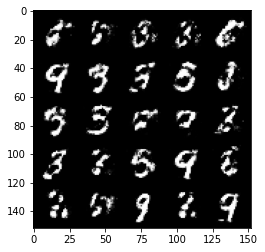

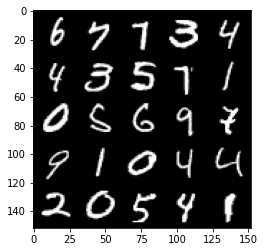

Step 76000: Generator loss: 1.517897258043289, discriminator loss: 0.4229041969776149


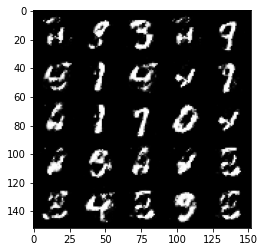

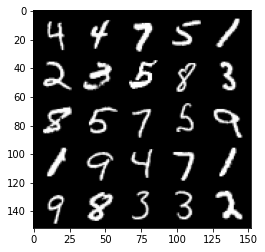

Step 76500: Generator loss: 1.6831081192493436, discriminator loss: 0.3636324239373208


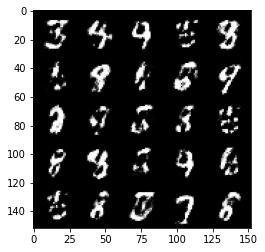

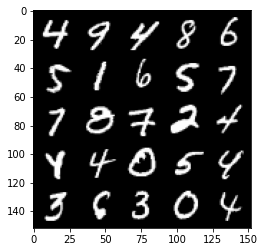

Step 77000: Generator loss: 1.6064223117828356, discriminator loss: 0.3878751600384714


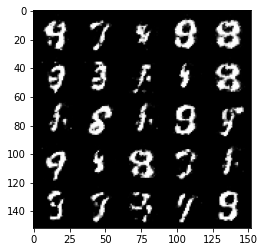

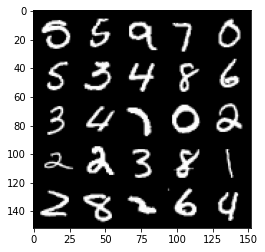

Step 77500: Generator loss: 1.5772364566326147, discriminator loss: 0.39160249406099296


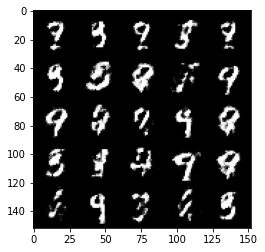

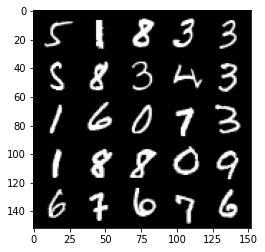

Step 78000: Generator loss: 1.692790352821349, discriminator loss: 0.3620478791594505


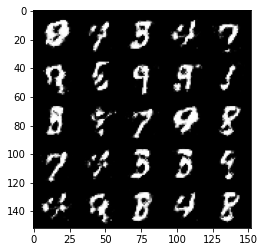

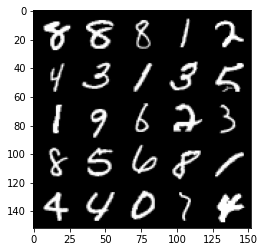

Step 78500: Generator loss: 1.5078792695999155, discriminator loss: 0.42777369529008863


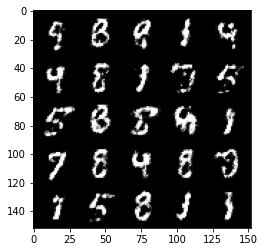

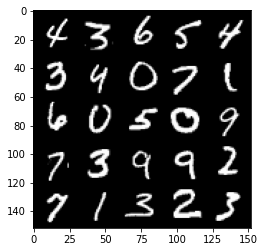

Step 79000: Generator loss: 1.4798592426776895, discriminator loss: 0.4182234022021296


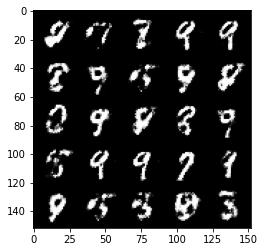

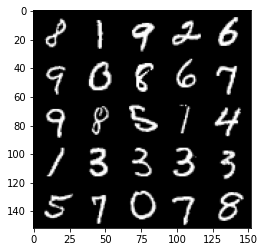

Step 79500: Generator loss: 1.6418854649066923, discriminator loss: 0.3808475199937824


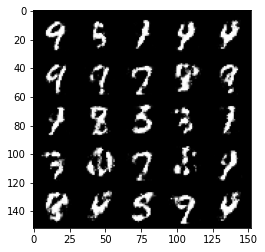

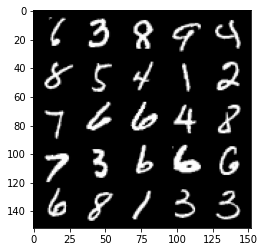

Step 80000: Generator loss: 1.5978870050907128, discriminator loss: 0.4072550625801087


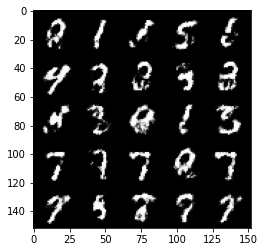

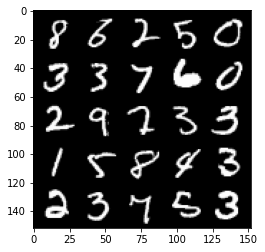

Step 80500: Generator loss: 1.5380828659534445, discriminator loss: 0.42489411610364874


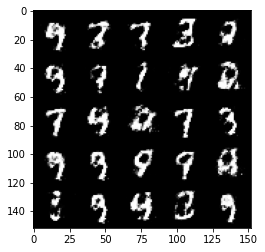

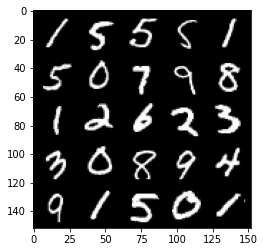

Step 81000: Generator loss: 1.695655543565749, discriminator loss: 0.36771183818578757


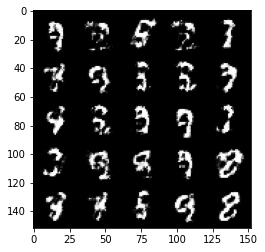

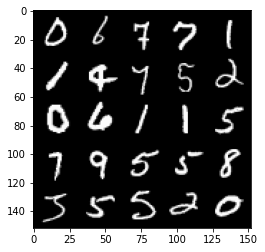

Step 81500: Generator loss: 1.498398501157761, discriminator loss: 0.4239374520778653


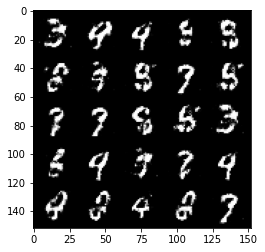

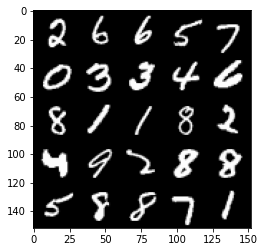

Step 82000: Generator loss: 1.688739665508271, discriminator loss: 0.35427368545532223


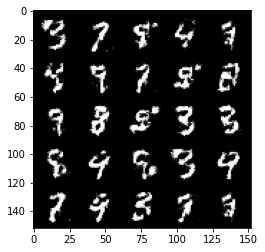

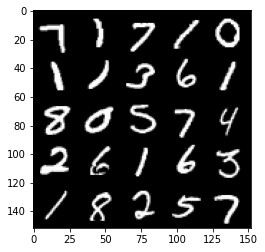

Step 82500: Generator loss: 1.734071886777877, discriminator loss: 0.3670743414759638


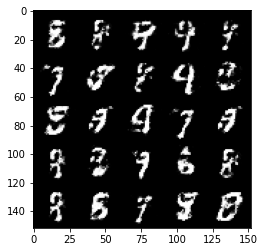

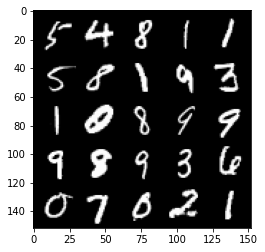

Step 83000: Generator loss: 1.5496008710861198, discriminator loss: 0.4150537089705466


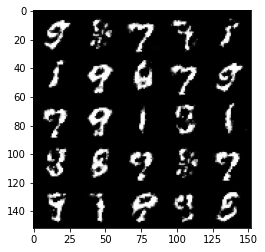

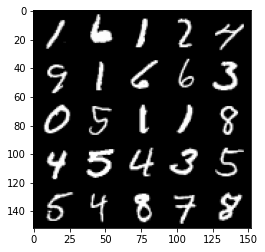

Step 83500: Generator loss: 1.5669068372249617, discriminator loss: 0.3985607194900515


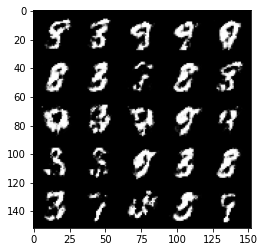

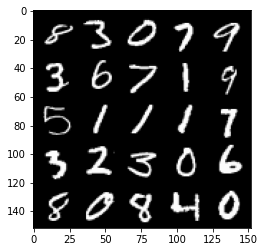

Step 84000: Generator loss: 1.5077174589633944, discriminator loss: 0.4296913902163509


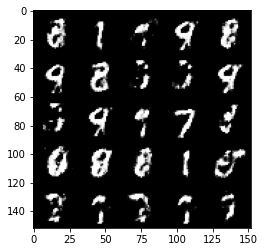

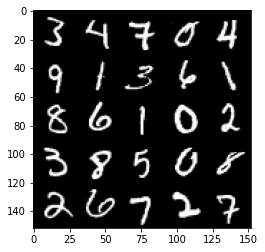

Step 84500: Generator loss: 1.4640033118724827, discriminator loss: 0.4205775989890101


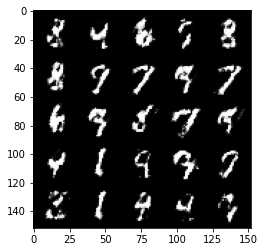

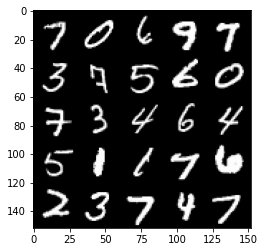

Step 85000: Generator loss: 1.5375042581558247, discriminator loss: 0.40833859062194805


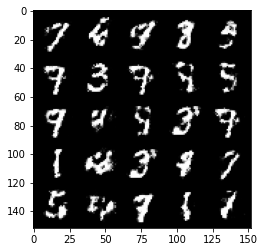

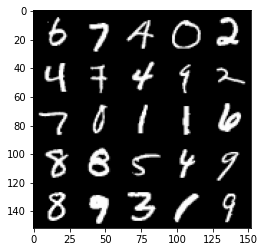

Step 85500: Generator loss: 1.4595621485710157, discriminator loss: 0.4249704390764236


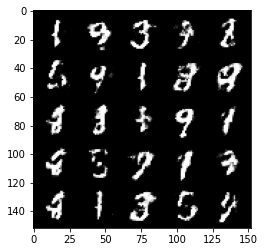

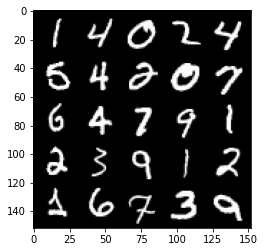

Step 86000: Generator loss: 1.5345217559337616, discriminator loss: 0.4057604999542237


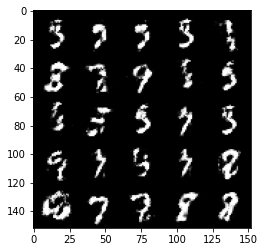

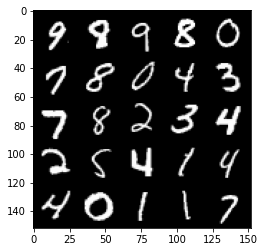

Step 86500: Generator loss: 1.5825451173782343, discriminator loss: 0.38829607653617926


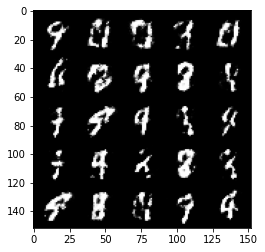

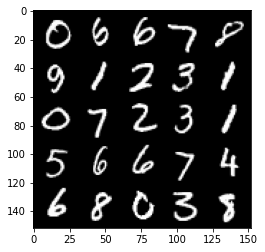

Step 87000: Generator loss: 1.4634162929058083, discriminator loss: 0.430508794724941


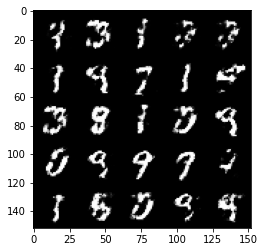

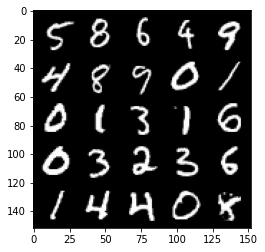

Step 87500: Generator loss: 1.4802606215476983, discriminator loss: 0.41420967179536833


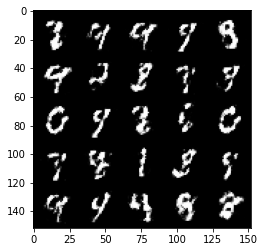

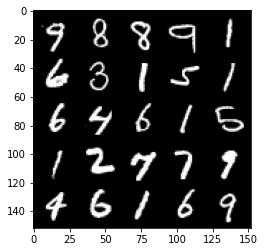

Step 88000: Generator loss: 1.5317646470069892, discriminator loss: 0.406175178229809


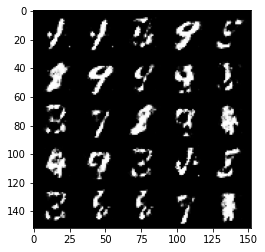

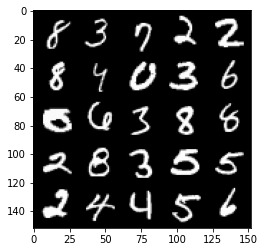

Step 88500: Generator loss: 1.4584970550537113, discriminator loss: 0.41717152470350244


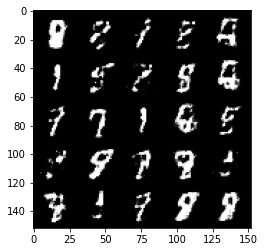

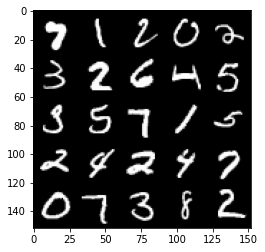

Step 89000: Generator loss: 1.5064378602504724, discriminator loss: 0.4012442745566363


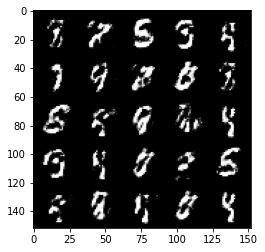

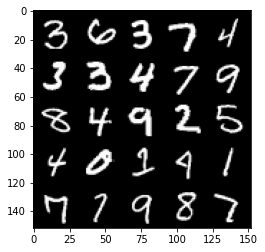

Step 89500: Generator loss: 1.521377577543259, discriminator loss: 0.4043206048011777


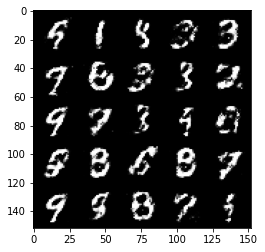

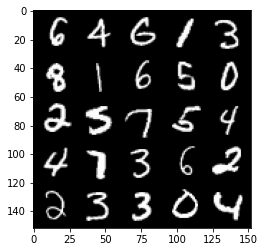

Step 90000: Generator loss: 1.4728036777973161, discriminator loss: 0.41771417313814135


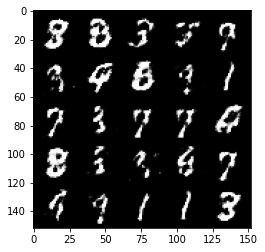

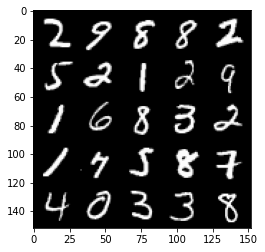

Step 90500: Generator loss: 1.450600334882737, discriminator loss: 0.41463226431608197


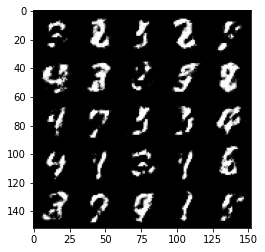

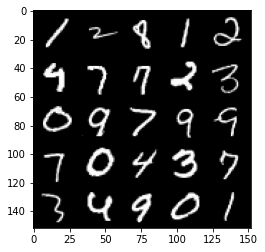

Step 91000: Generator loss: 1.4349625589847566, discriminator loss: 0.4266740778088569


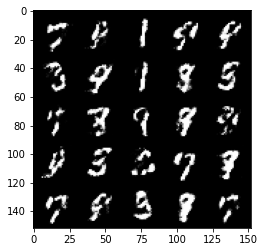

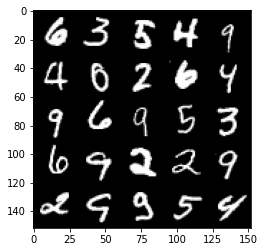

Step 91500: Generator loss: 1.4248878540992744, discriminator loss: 0.44194031584262833


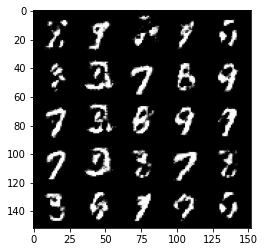

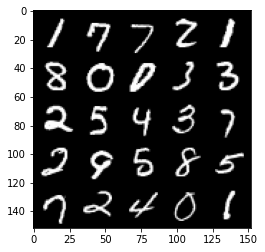

Step 92000: Generator loss: 1.4111580517292028, discriminator loss: 0.4344744260907174


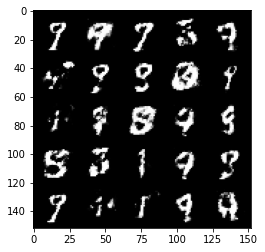

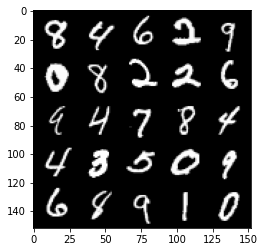

Step 92500: Generator loss: 1.434481887102128, discriminator loss: 0.4255753421187403


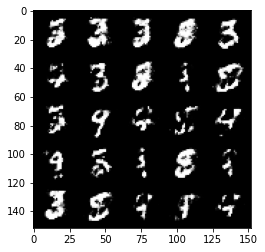

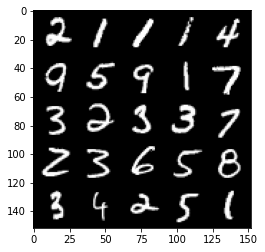

Step 93000: Generator loss: 1.3287835767269134, discriminator loss: 0.4661529714465138


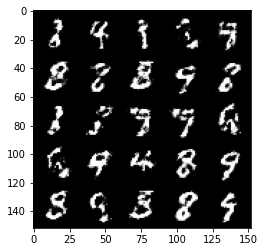

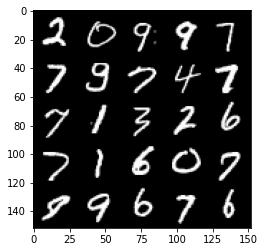

Step 93500: Generator loss: 1.5374575624465936, discriminator loss: 0.396593577325344


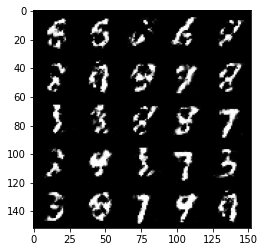

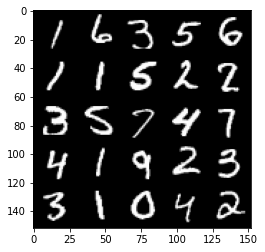

In [26]:
# OPTIONAL PART

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1


If you don't get any runtime error, it means that your code works. We check that the weights are changing in each iteration within the function.

**Congratulations, you have trained your first GAN**